# Import Libraries

In [ ]:
import pandas as pd
import sklearn as sk
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from typing import Tuple
from random import randint
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
import plotly.express as px
from scipy.stats import randint
import plotly.graph_objects as go
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import probplot, boxcox
import collections
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split ,GridSearchCV
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Load the dataset:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/My Drive/datasets/Book1.csv'
data = pd.read_csv(file_path, encoding = "latin-1")

<ipython-input-3-5bb195b4bbd6>:2: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path, encoding = "latin-1")


In [ ]:
data.shape

(99492, 22)

In [ ]:
data.head()

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_feet,address,cityname,state,latitude,longitude,source,time
0,5668640009,housing/rent/apartment,One BR 507 & 509 Esplanade,"This unit is located at 507 & 509 Esplanade, R...",NaN,1.0,1.0,USD,No,Thumbnail,...,"$2,195",Monthly,542,507 509 Esplanade,Redondo Beach,CA,33.8520,-118.3759,RentLingo,1577360355
1,5668639818,housing/rent/apartment,Three BR 146 Lochview Drive,"This unit is located at 146 Lochview Drive, Ne...",NaN,1.5,3.0,USD,No,Thumbnail,...,"$1,250",Monthly,1500,146 Lochview Dr,Newport News,VA,37.0867,-76.4941,RentLingo,1577360340
2,5668639686,housing/rent/apartment,Three BR 3101 Morningside Drive,This unit is located at 3101 Morningside Drive...,NaN,2.0,3.0,USD,No,Thumbnail,...,"$1,395",Monthly,1650,3101 Morningside Dr,Raleigh,NC,35.8230,-78.6438,RentLingo,1577360332
3,5668639659,housing/rent/apartment,Two BR 209 Aegean Way,"This unit is located at 209 Aegean Way, Vacavi...",NaN,1.0,2.0,USD,No,Thumbnail,...,"$1,600",Monthly,820,209 Aegean Way,Vacaville,CA,38.3622,-121.9712,RentLingo,1577360330
4,5668639374,housing/rent/apartment,One BR 4805 Marquette NE,"This unit is located at 4805 Marquette NE, Alb...",NaN,1.0,1.0,USD,No,Thumbnail,...,$975,Monthly,624,4805 Marquette NE,Albuquerque,NM,35.1038,-106.6110,RentLingo,1577360308


In [ ]:
data.tail()

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_feet,address,cityname,state,latitude,longitude,source,time
99487,5121219946,housing/rent/apartment,Houston - superb Apartment nearby fine dining,"Redefining urban living, in southeast Houston,...","Gym,Parking,Patio/Deck,Playground,Storage,Wood...",1.0,1.0,USD,No,Yes,...,$780,Monthly,605,NaN,Houston,TX,29.6151,-95.1998,RentDigs.com,1544185770
99488,5121219696,housing/rent/apartment,The Best of the Best in the City of Jacksonvil...,Courtney Manor Apartments offer the best of ev...,"AC,Cable or Satellite,Clubhouse,Dishwasher,Gym...",2.0,2.0,USD,No,Yes,...,$813,Monthly,921,NaN,Jacksonville,FL,30.2254,-81.7579,RentDigs.com,1544185750
99489,5121219420,housing/rent/apartment,A great & large One BR apartment. Pet OK!,"Fully remodeled, new floor, kitchen cabinet, s...","Garbage Disposal,Refrigerator",1.0,1.0,USD,No,Yes,...,"$1,325",Monthly,650,NaN,San Diego,CA,32.7379,-117.0914,RentDigs.com,1544185729
99490,5121218935,housing/rent/apartment,"The Crest offers studio, 1, 2 & Three BR homes...","Amenities include a fitness facilities, swimmi...","Gym,Pool",1.0,1.0,USD,No,Yes,...,$931,Monthly,701,NaN,Huntersville,NC,35.4158,-80.8451,RentDigs.com,1544185670
99491,5121218844,housing/rent/apartment,Large Remodeled Two BR 1. Five BA Apartment Home,This is a brand new 2 Beds 1. five Bathrooms A...,"Gated,Parking,Wood Floors",1.5,2.0,USD,No,Yes,...,"$1,595",Monthly,900,NaN,San Diego,CA,32.7379,-117.0914,RentDigs.com,1544185659


# P1 Data Analysis

## P1.0 find the categirucal and numerical column

In [ ]:
# first we will count how many cateforical and numrical columns
def count_categorical_numerical_columns(df)-> Tuple[int, int]:
    # Select categorical columns
    categorical_columns = df.select_dtypes(include=['object']).columns
    num_categorical_columns = len(categorical_columns)

    # Select numerical columns
    numerical_columns = df.select_dtypes(exclude=['object']).columns
    num_numerical_columns = len(numerical_columns)
    return num_categorical_columns, num_numerical_columns

num_categorical, num_numerical = count_categorical_numerical_columns(data)
print("Number of categorical columns:", num_categorical)
print("Number of numerical columns:", num_numerical)

Number of categorical columns: 14
Number of numerical columns: 8


**from analysis**

- The data contains 14 categorical columns and 8 numerical column

**from analysis**

- Both body and the title contains mostly the information related to the location, no of bedrooms , price range which details are already present in the other columns respectively.

## P1.1 Removing unnecessary columns

In [ ]:
# Removing unnecessary features
data = data.drop(columns =["id","title","body"])

In [ ]:
data.columns

Index(['category', 'amenities', 'bathrooms', 'bedrooms', 'currency', 'fee',
       'has_photo', 'pets_allowed', 'price', 'price_display', 'price_type',
       'square_feet', 'address', 'cityname', 'state', 'latitude', 'longitude',
       'source', 'time'],
      dtype='object')

## P1.2 Display Unique values & remove unique value

In [ ]:
def display_unique_values(df):
    # Select categorical columns
    categorical_columns = df.select_dtypes(include=['object']).columns

    # Create an empty list to store unique values data
    unique_values_data = []

    # Iterate over each categorical column
    for col in categorical_columns:
        unique_values = df[col].unique()
        unique_values_data.append({'Column': col, 'Unique_Values': unique_values})

    # Create a DataFrame from the list of unique values data
    unique_values_df = pd.DataFrame(unique_values_data)

    return unique_values_df
unique_values_df = display_unique_values(data)
unique_values_df

,Column,Unique_Values
0,category,"[housing/rent/apartment, housing/rent/home, ho..."
1,amenities,"[nan, Fireplace,Gym,Parking,Pool,Storage,Wood ..."
2,currency,[USD]
3,fee,"[No, Yes]"
4,has_photo,"[Thumbnail, No, Yes]"
5,pets_allowed,"[Cats, Cats,Dogs, nan, Dogs, Cats,Dogs,None]"
6,price_display,"[$2,195, $1,250, $1,395, $1,600, $975, $1,300,..."
7,price_type,"[Monthly, Weekly, Monthly|Weekly]"
8,address,"[507 509 Esplanade, 146 Lochview Dr, 3101 Mor..."
9,cityname,"[Redondo Beach, Newport News, Raleigh, Vacavil..."


**from analysis**

- There are columns like address, amenities, cityname , state and source which has higher no of unique values greater than 20.
- The currency column has one value only which is USD.
- The price_display is under catgorical column but it should be a numerical column.

In [ ]:
data['price_display'].value_counts()

,count
price_display,
"$1,350",574
$850,547
"$1,200",538
$950,528
"$1,100",522
...,...
"$3,319",1
"$3,828",1
"$4,069",1


In [ ]:
# Remove non-numeric characters price display column
data['price_display'] = data['price_display'].str.replace('[^\d.]', '', regex=True)
# Convert the cleaned column to numeric type
data['price_display'] = pd.to_numeric(data['price_display'])

In [ ]:
data['price_display'].value_counts()

,count
price_display,
1350.0,574
850.0,548
1200.0,538
950.0,528
1100.0,522
...,...
3573.0,1
3454.0,1
3268.0,1


## P1.3 Convert time into humna readable format

In [ ]:
data['time'] = pd.to_datetime(data['time'], unit='s')

In [ ]:
data['time'].head()

,time
0,2019-12-26 11:39:15
1,2019-12-26 11:39:00
2,2019-12-26 11:38:52
3,2019-12-26 11:38:50
4,2019-12-26 11:38:28


In [ ]:
data["time"].dtype

dtype('<M8[ns]')

In [ ]:
# Extracting features from datetime
data['year'] = data['time'].dt.year
data['month'] = data['time'].dt.month
data['day'] = data['time'].dt.day
data['hour'] = data['time'].dt.hour
data['minute'] = data['time'].dt.minute
data['second'] = data['time'].dt.second
data['day_of_week'] = data['time'].dt.dayofweek  # Monday=0, Sunday=6
data['day_of_year'] = data['time'].dt.dayofyear

In [ ]:
data.columns

Index(['category', 'amenities', 'bathrooms', 'bedrooms', 'currency', 'fee',
       'has_photo', 'pets_allowed', 'price', 'price_display', 'price_type',
       'square_feet', 'address', 'cityname', 'state', 'latitude', 'longitude',
       'source', 'time', 'year', 'month', 'day', 'hour', 'minute', 'second',
       'day_of_week', 'day_of_year'],
      dtype='object')

## P1.4 check the duplicate and drop the duplicate columns

In [ ]:
# check the duplicate
data.duplicated().sum()

117

In [ ]:
# Remove duplicate rows
data = data.drop_duplicates()

In [ ]:
# once again check the duplicate
data.duplicated().sum()

0

## P1.5 check the missing value and remove missing value

In [ ]:
# Check the missing values
data.isna().sum()

,0
category,0
amenities,16028
bathrooms,63
bedrooms,124
currency,0
fee,0
has_photo,0
pets_allowed,60354
price,1
price_display,1


In [ ]:
# find the null vaue in percentage in each column
missing_percentage = (data.isnull().sum() / len(data)) * 100

missing_percentage = missing_percentage.round(2)

print(missing_percentage)

category          0.00
amenities        16.13
bathrooms         0.06
bedrooms          0.12
currency          0.00
fee               0.00
has_photo         0.00
pets_allowed     60.73
price             0.00
price_display     0.00
price_type        0.00
square_feet       0.00
address          92.01
cityname          0.30
state             0.30
latitude          0.03
longitude         0.03
source            0.00
time              0.00
year              0.00
month             0.00
day               0.00
hour              0.00
minute            0.00
second            0.00
day_of_week       0.00
day_of_year       0.00
dtype: float64


**from analysis**

- The features bathrooms, bedrooms, latitude and longitude have very small percentage of missing values. They are being replaced by median.
- The feature pets_allowed has a lot of missing values ,imputing with a new category (Unknown).

In [ ]:
# Fill bathrooms ,bedrooms,latitude and longitude column  with median values
data['bathrooms'].fillna(data['bathrooms'].median(), inplace=True)
data['bedrooms'].fillna(data['bedrooms'].median(), inplace=True)
data['latitude'].fillna(data['latitude'].median(), inplace=True)
data['longitude'].fillna(data['longitude'].median(), inplace=True)

In [ ]:
# fill 'pets_allowed' with 'Unknown'
data['pets_allowed'].fillna('Unknown', inplace=True)

In [ ]:
# Remove rows with missing values in the target column
data = data.dropna(subset=['price'])

In [ ]:
# Rechecking for the missing values
data.isna().sum()

,0
category,0
amenities,16028
bathrooms,0
bedrooms,0
currency,0
fee,0
has_photo,0
pets_allowed,0
price,0
price_display,0


**Note**

The missing values in columns like amenities, address, cityname and state will be handled afterwards, as these columns have high cardinality so I will remove it letter.


## P1.6 Univarite analysis

In [ ]:
data.columns

Index(['category', 'amenities', 'bathrooms', 'bedrooms', 'currency', 'fee',
       'has_photo', 'pets_allowed', 'price', 'price_display', 'price_type',
       'square_feet', 'address', 'cityname', 'state', 'latitude', 'longitude',
       'source', 'time', 'year', 'month', 'day', 'hour', 'minute', 'second',
       'day_of_week', 'day_of_year'],
      dtype='object')

In [ ]:
def visualize_numerical_column(df, column_name):

    # Create and show histogram
    fig_hist = px.histogram(df, x=column_name, color_discrete_sequence=px.colors.qualitative.Set3, title=f"{column_name} Distribution Histogram")
    fig_hist.show()

    # Create and show boxplot
    fig_box = px.box(df, x=column_name, title=f"Boxplot for {column_name}")
    fig_box.show()

In [ ]:
visualize_numerical_column(data,"price")

- There are Outliers in our Target variable ( outside the InterQuartile range).
- We need to handle the Outliers here  

In [ ]:
# visualize the square feet
visualize_numerical_column(data,"square_feet")

## P1.7 Visualize the categorical columns  

In [ ]:
def visualize_categorical_column(df, column_name):

    # Set style and create count plot with Seaborn
    sns.set_style('whitegrid')
    fig, axes = plt.subplots(figsize=(8, 4))
    ax = sns.countplot(x=column_name, data=df, palette=['#e3784d', '#87ace8', '#6ecc64', '#b644e3', '#eb7c87', '#EAE509'])
    for container in ax.containers:
        ax.bar_label(container)
    plt.title(f'Frequency of {column_name}', fontsize=15)
    plt.show()

    # Create pie chart with Plotly Express
    fig_pie = px.pie(df, names=column_name, height=700, width=700,
                     color_discrete_sequence=px.colors.sequential.deep,
                     title=f'Pie Chart for {column_name}')
    fig_pie.update_traces(textfont_size=15)
    fig_pie.show()

<ipython-input-32-de3979d7b95c>:6: UserWarning:


The palette list has fewer values (6) than needed (16) and will cycle, which may produce an uninterpretable plot.



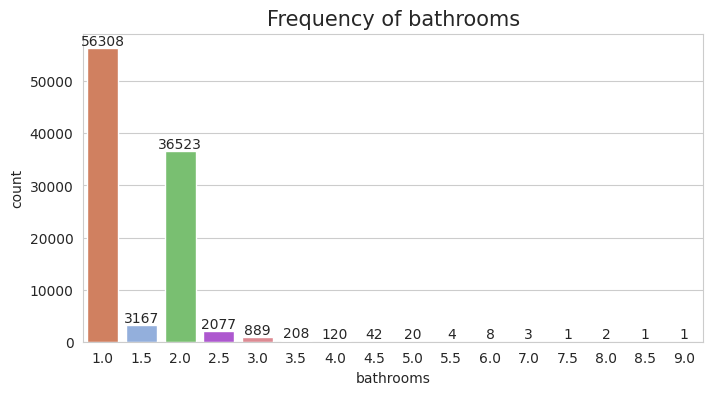

In [ ]:
visualize_categorical_column(data,"bathrooms")

<ipython-input-32-de3979d7b95c>:6: UserWarning:


The palette list has fewer values (6) than needed (10) and will cycle, which may produce an uninterpretable plot.



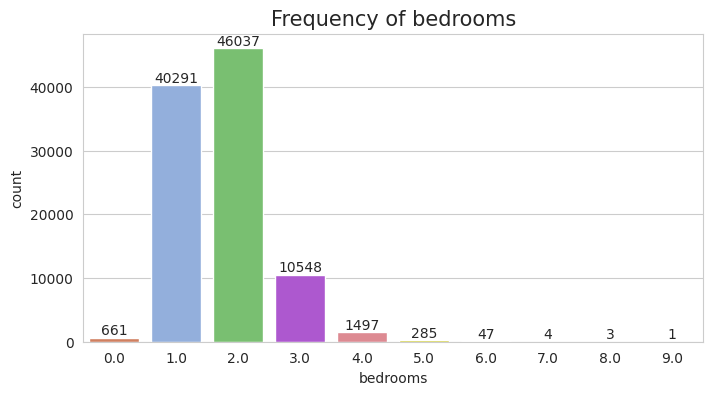

In [ ]:
visualize_categorical_column(data,"bedrooms")

<ipython-input-32-de3979d7b95c>:6: UserWarning:


The palette list has fewer values (6) than needed (7) and will cycle, which may produce an uninterpretable plot.



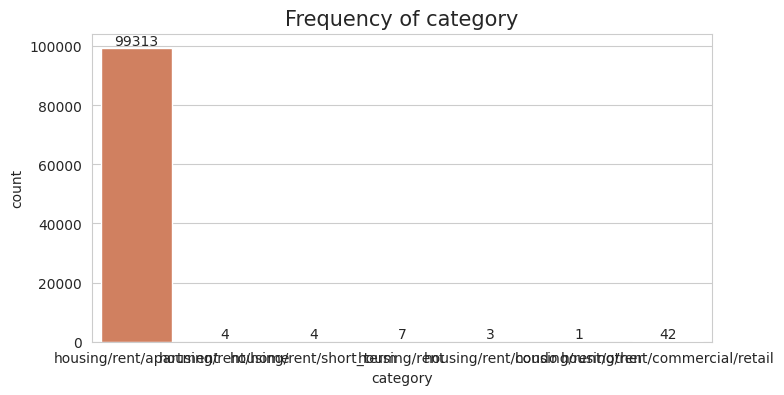

In [ ]:
visualize_categorical_column(data,"category")

<ipython-input-32-de3979d7b95c>:6: UserWarning:

The palette list has more values (6) than needed (2), which may not be intended.



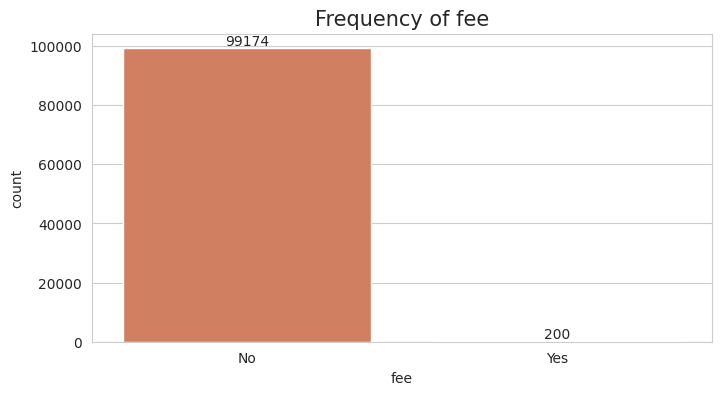

In [ ]:
visualize_categorical_column(data,"fee")

<ipython-input-32-de3979d7b95c>:6: UserWarning:

The palette list has more values (6) than needed (3), which may not be intended.



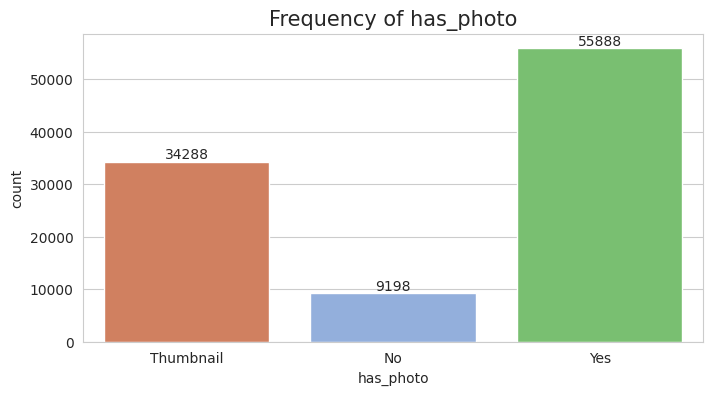

In [ ]:
visualize_categorical_column(data,"has_photo")

<ipython-input-32-de3979d7b95c>:6: UserWarning:

The palette list has more values (6) than needed (5), which may not be intended.



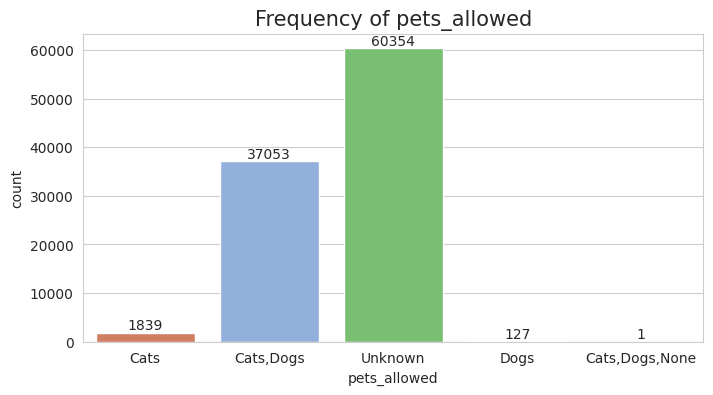

In [ ]:
visualize_categorical_column(data,"pets_allowed")

<ipython-input-32-de3979d7b95c>:6: UserWarning:

The palette list has more values (6) than needed (3), which may not be intended.



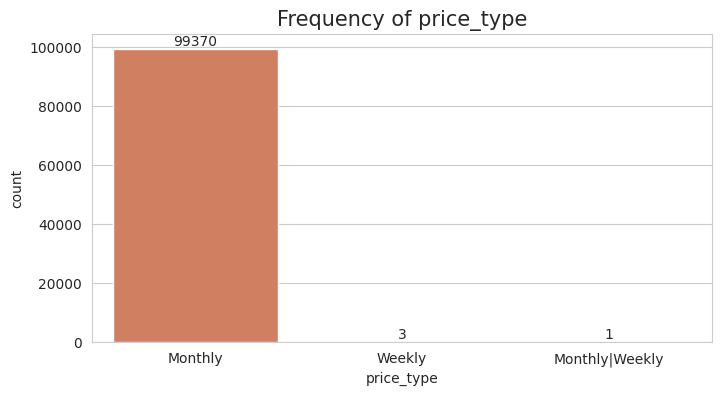

In [ ]:
visualize_categorical_column(data,"price_type")

## P1.8 Bivariate Analysis wrt to Rent

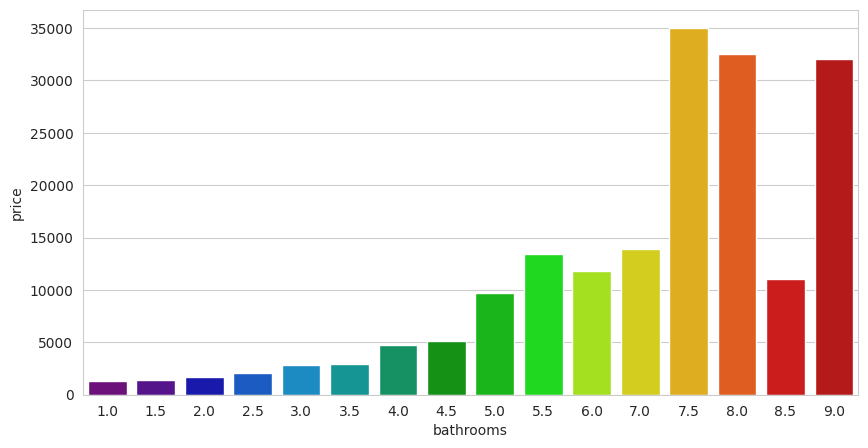

In [ ]:
## Relationship between rent price vs bathrooms

plt.figure(figsize = (10, 5))
sns.barplot(x = data["bathrooms"], y = data["price"], palette = "nipy_spectral",errorbar = None);

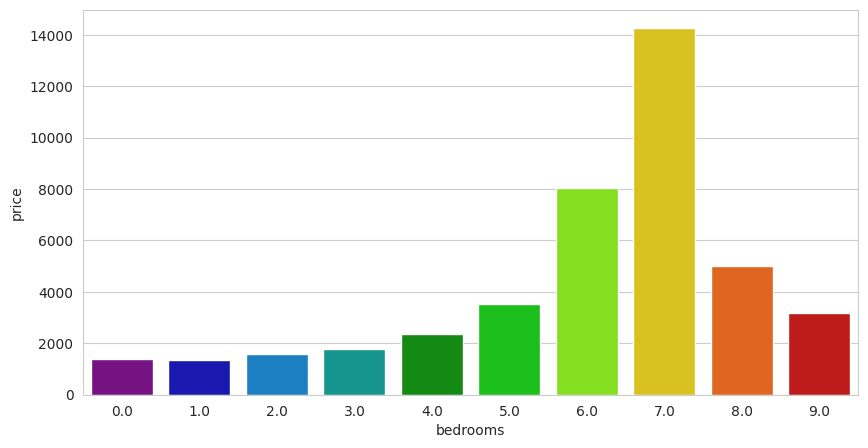

In [ ]:
# Relationship between rent price vs bedrooms
plt.figure(figsize = (10, 5))
sns.barplot(x = data["bedrooms"], y = data["price"], palette = "nipy_spectral",errorbar = None);

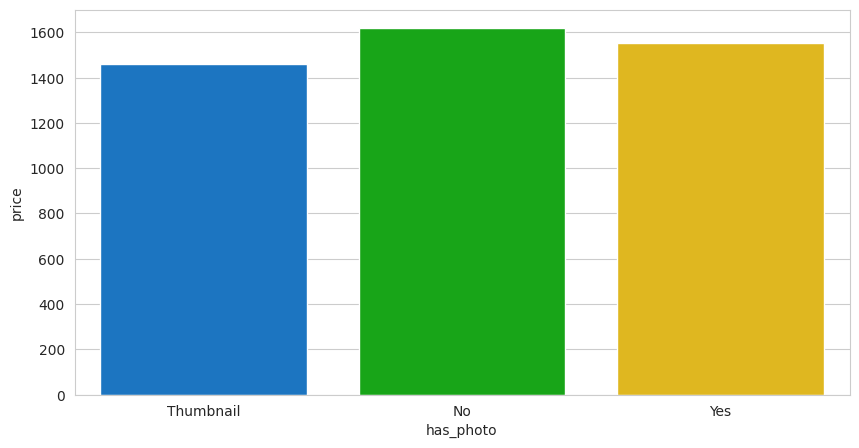

In [ ]:
# Relationship between rent price vs has_photo
plt.figure(figsize = (10, 5))
sns.barplot(x = data["has_photo"], y = data["price"], palette = "nipy_spectral",errorbar = None);

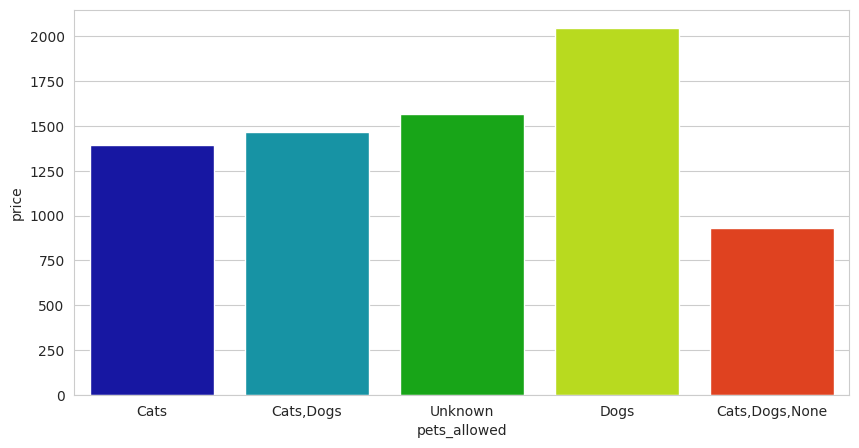

In [ ]:
# Relationship between rent price vs pets_allowed
plt.figure(figsize = (10, 5))
sns.barplot(x = data["pets_allowed"], y = data["price"], palette = "nipy_spectral",errorbar = None);

# P1.1 Feature Engineering

## P1.1.0 Print the categorical and numerical column separatley

In [ ]:
data.columns

Index(['category', 'amenities', 'bathrooms', 'bedrooms', 'currency', 'fee',
       'has_photo', 'pets_allowed', 'price', 'price_display', 'price_type',
       'square_feet', 'address', 'cityname', 'state', 'latitude', 'longitude',
       'source', 'time', 'year', 'month', 'day', 'hour', 'minute', 'second',
       'day_of_week', 'day_of_year'],
      dtype='object')

In [ ]:
categorical_columns =  data.select_dtypes(include=['object']).columns.tolist()
# Selecting numerical columns
numerical_columns = data.select_dtypes(include=['number']).columns
# Creating DataFrame with only categorical columns
categorical_data = data[categorical_columns]
# Creating DataFrame with only numerical columns
numerical_data = data[numerical_columns]

In [ ]:
categorical_data.columns

Index(['category', 'amenities', 'currency', 'fee', 'has_photo', 'pets_allowed',
       'price_type', 'address', 'cityname', 'state', 'source'],
      dtype='object')

In [ ]:
numerical_data.columns

Index(['bathrooms', 'bedrooms', 'price', 'price_display', 'square_feet',
       'latitude', 'longitude', 'year', 'month', 'day', 'hour', 'minute',
       'second', 'day_of_week', 'day_of_year'],
      dtype='object')

## P1.1.1 Remove the constant numerical columns

In [ ]:
# Removing the constant Features
varModel=VarianceThreshold(threshold=0)
varModel.fit(numerical_data)

VarianceThreshold(threshold=0)

In [ ]:
constArr=varModel.get_support()
collections.Counter(constArr)

Counter({True: 15})

In [ ]:
#Print out constant feature name
constCol=[col for col in numerical_data.columns if col not in numerical_data.columns[constArr]]
constCol

[]

In [ ]:
#Create variance threshold model
quasiModel=VarianceThreshold(threshold=0.01) #It will search for the features having 99% of same value in all samples.
quasiModel.fit(numerical_data)

VarianceThreshold(threshold=0.01)

In [ ]:
quasiArr=quasiModel.get_support()
collections.Counter(quasiArr)

Counter({True: 15})

In [ ]:
#Print out quasi constant feature name
quasiCols=[col for col in numerical_data.columns if col not in numerical_data.columns[quasiArr]]
quasiCols

[]

## P1.1.2 Remove the constant categorical columns

In [ ]:
categorical_data.columns

Index(['category', 'amenities', 'currency', 'fee', 'has_photo', 'pets_allowed',
       'price_type', 'address', 'cityname', 'state', 'source'],
      dtype='object')

In [ ]:
# so here we will use ordinalEncoder method to convert categorical into numerical value
ord_enc = OrdinalEncoder()
# Fit and transform the data using the encoder
data_encoded = ord_enc.fit_transform(categorical_data)
# Convert the encoded data back to a DataFrame
categorical_data_encoded = pd.DataFrame(data_encoded, columns=categorical_data.columns)

In [ ]:
varModel=VarianceThreshold(threshold=0)
varModel.fit(categorical_data_encoded)

VarianceThreshold(threshold=0)

In [ ]:
constArr=varModel.get_support()
collections.Counter(constArr)

Counter({True: 10, False: 1})

In [ ]:
#Print out constant feature name
constCol=[col for col in categorical_data_encoded.columns if col not in categorical_data_encoded.columns[constArr]]
constCol

['currency']

In [ ]:
#Create variance threshold model
quasiModel=VarianceThreshold(threshold=0.01) #It will search for the features having 99% of same value in all samples.
quasiModel.fit(categorical_data_encoded)

VarianceThreshold(threshold=0.01)

In [ ]:
quasiArr=quasiModel.get_support()
collections.Counter(quasiArr)

Counter({False: 4, True: 7})

In [ ]:
#Print out quasi constant feature name
quasiCols=[col for col in categorical_data_encoded.columns if col not in categorical_data_encoded.columns[quasiArr]]
quasiCols

['category', 'currency', 'fee', 'price_type']

**from analysis**

These columns need to removed as the following features have the high constant values in our data

- **Numerical Data** :- No Columns have the constant values.
- **Categorical Data** :- 'category', 'currency', 'fee', 'price_type'ta

In [ ]:
data = data.drop(columns =['category', 'currency', 'fee', 'price_type'])

In [ ]:
data.shape

(99374, 23)

## P1.1.3 Checking for the duplicate columns

In [ ]:
def duplicateColumns(data):
    dupliCols=[]
    for i in range(0,len(data.columns)):
        col1=data.columns[i]
        for col2 in data.columns[i+1:]:
            if data[col1].equals(data[col2]):
                dupliCols.append(col1+','+col2)
    return dupliCols

In [ ]:
duplCols=duplicateColumns(data)
duplCols

[]

In [ ]:
data.columns

Index(['amenities', 'bathrooms', 'bedrooms', 'has_photo', 'pets_allowed',
       'price', 'price_display', 'square_feet', 'address', 'cityname', 'state',
       'latitude', 'longitude', 'source', 'time', 'year', 'month', 'day',
       'hour', 'minute', 'second', 'day_of_week', 'day_of_year'],
      dtype='object')

**No duplicate columns in the data**

## P1.1.4 Removing the features with high cardinality

This is done because of the following reasons :-

- Overfitting problems.
- Avoid excessive use of memory.
- Better interpretation of data due to reduce feature space.

In [ ]:
categorical_columns = [col for col in data.columns if data[col].dtype == object]
columns_with_high_cardinality = [col for col in categorical_columns if data[col].nunique() > 20]
print(columns_with_high_cardinality)
data.drop(columns_with_high_cardinality, axis=1, inplace=True)

['amenities', 'address', 'cityname', 'state', 'source']


In [ ]:
data.shape

(99374, 18)

In [ ]:
data.columns

Index(['bathrooms', 'bedrooms', 'has_photo', 'pets_allowed', 'price',
       'price_display', 'square_feet', 'latitude', 'longitude', 'time', 'year',
       'month', 'day', 'hour', 'minute', 'second', 'day_of_week',
       'day_of_year'],
      dtype='object')

In [ ]:
# now we will remove "time" because I extract all features from it
data = data.drop(columns =['time'])

In [ ]:
data.columns

Index(['bathrooms', 'bedrooms', 'has_photo', 'pets_allowed', 'price',
       'price_display', 'square_feet', 'latitude', 'longitude', 'year',
       'month', 'day', 'hour', 'minute', 'second', 'day_of_week',
       'day_of_year'],
      dtype='object')

## P1.1.5 check the similirity

In [ ]:
def calculate_similarity_percentage(df, col1, col2):
    # Ensure both columns exist in the DataFrame
    if col1 not in df.columns or col2 not in df.columns:
        raise ValueError(f"Columns {col1} and/or {col2} not found in DataFrame")

    # Calculate the number of rows where the values are equal
    equal_values_count = (df[col1] == df[col2]).sum()

    # Calculate the total number of rows
    total_rows = len(df)

    # Calculate the percentage of similarity
    similarity_percentage = (equal_values_count / total_rows) * 100

    return similarity_percentage

In [ ]:
similarity = calculate_similarity_percentage(data, 'price', 'price_display')
print(f"The columns 'col1' and 'col2' are {similarity:.2f}% similar.")

The columns 'col1' and 'col2' are 99.97% similar.


In [ ]:
# now I  will remove "price_display" column because they are 99% similar to price column
data = data.drop(columns =['price_display'])

In [ ]:
data.head()

,bathrooms,bedrooms,has_photo,pets_allowed,price,square_feet,latitude,longitude,year,month,day,hour,minute,second,day_of_week,day_of_year
0,1.0,1.0,Thumbnail,Cats,2195.0,542,33.8520,-118.3759,2019,12,26,11,39,15,3,360
1,1.5,3.0,Thumbnail,"Cats,Dogs",1250.0,1500,37.0867,-76.4941,2019,12,26,11,39,0,3,360
2,2.0,3.0,Thumbnail,Unknown,1395.0,1650,35.8230,-78.6438,2019,12,26,11,38,52,3,360
3,1.0,2.0,Thumbnail,"Cats,Dogs",1600.0,820,38.3622,-121.9712,2019,12,26,11,38,50,3,360
4,1.0,1.0,Thumbnail,"Cats,Dogs",975.0,624,35.1038,-106.6110,2019,12,26,11,38,28,3,360


## P1.1.6 Converting the categorical features into numerical features

In [ ]:
def one_hot_encode(data, column):
    encoded = pd.get_dummies(data[column], drop_first= True,dtype=float)
    data = data.drop(column, axis = 1)
    data = data.join(encoded)
    return data

In [ ]:
columns = ['has_photo','pets_allowed']
for col in columns:
    data = one_hot_encode(data, col)

In [ ]:
data.head()

,bathrooms,bedrooms,price,square_feet,latitude,longitude,year,month,day,hour,minute,second,day_of_week,day_of_year,Thumbnail,Yes,"Cats,Dogs","Cats,Dogs,None",Dogs,Unknown
0,1.0,1.0,2195.0,542,33.8520,-118.3759,2019,12,26,11,39,15,3,360,1.0,0.0,0.0,0.0,0.0,0.0
1,1.5,3.0,1250.0,1500,37.0867,-76.4941,2019,12,26,11,39,0,3,360,1.0,0.0,1.0,0.0,0.0,0.0
2,2.0,3.0,1395.0,1650,35.8230,-78.6438,2019,12,26,11,38,52,3,360,1.0,0.0,0.0,0.0,0.0,1.0
3,1.0,2.0,1600.0,820,38.3622,-121.9712,2019,12,26,11,38,50,3,360,1.0,0.0,1.0,0.0,0.0,0.0
4,1.0,1.0,975.0,624,35.1038,-106.6110,2019,12,26,11,38,28,3,360,1.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
data.columns

Index(['bathrooms', 'bedrooms', 'price', 'square_feet', 'latitude',
       'longitude', 'year', 'month', 'day', 'hour', 'minute', 'second',
       'day_of_week', 'day_of_year', 'Thumbnail', 'Yes', 'Cats,Dogs',
       'Cats,Dogs,None', 'Dogs', 'Unknown'],
      dtype='object')

In [ ]:
data.shape

(99374, 20)

# P2 Predict Output (price) using:
- Random Forest (RF)
- Decision Tree (DT)
- KNN
- Artificial Neural Network (ANN)


## P2.1 Divide the data into training and testing

In [ ]:
# Check for non-positive values
non_positive_values = data['price'] <= 0
print("Number of non-positive values in 'price':", non_positive_values.sum())

Number of non-positive values in 'price': 0


In [ ]:
X = data.drop('price', axis= 1)
Y = data['price']

# I use Box-Cox method it is mostly used in regression problem to normalize the large value
bc_result = boxcox(Y)
y_boxcox = bc_result[0]
lambda_ = bc_result[1]

X_train, X_test, Y_train, Y_test = train_test_split(X, y_boxcox, test_size= 0.2, random_state = 42)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [ ]:
X_train.shape

(79499, 19)

In [ ]:
X_test.shape

(19875, 19)

In [ ]:
Y_train.shape

(79499,)

In [ ]:
Y_test.shape

(19875,)

## P2.2 Random Forest (RF)

In [ ]:
regressor = RandomForestRegressor(n_estimators=300, random_state=42)

# Fit the regressor with x and y data
regressor.fit(X_train, Y_train)

RandomForestRegressor(n_estimators=300, random_state=42)

In [ ]:
y_pred = regressor.predict(X_test)

In [ ]:
mae = mean_absolute_error(Y_test, y_pred)
r2 = r2_score(Y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"R-squared (R²): {r2:.2f}")

Mean Absolute Error (MAE): 0.02
R-squared (R²): 0.85


## P2.3 Dicision Tree (DT)

In [ ]:
param_dist = {
    'max_depth': randint(1, 20),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20)
}

In [ ]:
DT_regressor = DecisionTreeRegressor(random_state=42)

random_search = RandomizedSearchCV(DT_regressor, param_distributions=param_dist, n_iter=500, cv=5, random_state=42)

random_search.fit(X_train, Y_train)

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning:

invalid value encountered in cast



RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42),
                   n_iter=500,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7c54e44420b0>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7c54e4443a30>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x7c54e4443910>},
                   random_state=42)

In [ ]:
best_params_random = random_search.best_params_
best_score_random = random_search.best_score_

print(f"Best Parameters (Random Search): {best_params_random}")
print(f"Best Score (Random Search): {best_score_random}")

Best Parameters (Random Search): {'max_depth': 19, 'min_samples_leaf': 4, 'min_samples_split': 19}
Best Score (Random Search): 0.7668766924095579


## P2.4 K-Nearest Neighbors (KNN)

In [ ]:
grid_params = { 'n_neighbors' : range(1,50),
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

In [ ]:
gs = RandomizedSearchCV(KNeighborsRegressor(), grid_params, verbose = 1, cv=5, n_jobs = -1)

In [ ]:
# fit the model on our train set
g_res = gs.fit(X_train, Y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [ ]:
# find the best score
g_res.best_score_

0.6331992259021527

## P2.5 Artificial Neural Network (ANN)

In [ ]:
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

In [ ]:
model = Sequential()

In [ ]:
model = Sequential()
model.add(Dense(400,activation='relu',input_dim=19))
model.add(Dense(390,activation='relu'))
model.add(Dense(380,activation='relu'))
model.add(Dense(360,activation='relu'))
model.add(Dense(320,activation='relu'))
model.add(Dense(200,activation='relu'))
model.add(Dense(160,activation='relu'))
model.add(Dense(140,activation='relu'))
model.add(Dense(100,activation='relu'))
model.add(Dense(1,activation='linear'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
callback = EarlyStopping(monitor='val_loss',
                         min_delta=0.00001,
                         patience=20,
                         verbose=1,mode='auto',
                         baseline=None,
                         restore_best_weights=False)

In [ ]:
model.compile(optimizer='adam',loss='mean_squared_error',metrics=['mae'])

In [ ]:
model.fit(X_train,Y_train, validation_split=0.2 ,callbacks=callback, epochs=500 , batch_size=64,validation_data=(X_test,Y_test))

Epoch 1/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 24s 20ms/step - loss: 0.0033 - mae: 0.0406 - val_loss: 0.0024 - val_mae: 0.0380
Epoch 2/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 40s 19ms/step - loss: 0.0025 - mae: 0.0384 - val_loss: 0.0021 - val_mae: 0.0360
Epoch 3/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 21s 17ms/step - loss: 0.0074 - mae: 0.0397 - val_loss: 0.0022 - val_mae: 0.0369
Epoch 4/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 42s 18ms/step - loss: 0.0088 - mae: 0.0502 - val_loss: 0.0020 - val_mae: 0.0350
Epoch 5/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 40s 17ms/step - loss: 0.0021 - mae: 0.0352 - val_loss: 0.0021 - val_mae: 0.0358
Epoch 6/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 42s 18ms/step - loss: 0.0024 - mae: 0.0341 - val_loss: 0.0018 - val_mae: 0.0329
Epoch 7/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 41s 18ms/step - loss: 0.0018 - mae: 0.0323 - val_loss: 0.0017 - val_mae: 0.0317
Epoch 8/500
1243/1243 ━━━━━━━━━━━━━━━━━━━━ 41s 18ms/step - loss: 0.0016 - mae: 0.0311 - val_loss: 0.0018 - val_mae: 0.0325
Epoch 9/500
1243

In [ ]:
from sklearn.metrics import r2_score
y_pred = model.predict(X_test)

# Calculate R² score
r2 = r2_score(Y_test, y_pred)
print("R² Score:", r2)

622/622 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step
R² Score: 0.7350247328517348
